# DICOM Processing and Segmentation in Python
As described in https://www.raddq.com/dicom-processing-segmentation-visualization-in-python/

## Import packages

In [25]:
%matplotlib inline

import numpy as np
import pydicom as dicom
import os
import matplotlib.pyplot as plt
plt.style.use('seaborn')
from glob import glob
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import scipy.ndimage
from skimage import morphology
from skimage import measure
from skimage.transform import resize
from sklearn.cluster import KMeans
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import figure_factory as FF
from plotly.graph_objs import *
init_notebook_mode(connected=True)

#each patient has 20 slices
def sample_stack(stack, rows=4, cols=5, start_with=0, show_every=1):
    fig,ax = plt.subplots(rows,cols,figsize=[12,12])
    ind = start_with
    for i in range(rows):
        for j in range(cols):
            ax[i,j].set_title('slice %d' % (ind+1))
            ax[i,j].imshow(stack[ind],cmap='gray')
            ax[i,j].axis('off')
            ind = ind + show_every
    plt.show()

Let's visualize a single patient's Dixon MR spine scan study, specifically the water images for `Patient_ID = E1900`

In [2]:
PATIENT_ID = "E4634"
IMG_TYPE = "01" #for water, "02" for fat, "10" for fat frac, "00" for r2*
DATA_PATH = "../data/Vertebrae/"+PATIENT_ID+"/*"+IMG_TYPE+"/"
OUTPUT_PATH = WORKING_PATH = "./"
g = glob(DATA_PATH + '/*.DCM')

# Print out the first 5 file names to verify we're in the right folder.
print ("Total of %d DICOM images.\nFirst 5 filenames:" % len(g))
print ('\n'.join(g[:5]))

# Print out all file names
print ("All filenames:")
print ('\n'.join(g))

Total of 20 DICOM images.
First 5 filenames:
../data/Vertebrae/E4634/1001/E4634S1001I16.DCM
../data/Vertebrae/E4634/1001/E4634S1001I17.DCM
../data/Vertebrae/E4634/1001/E4634S1001I15.DCM
../data/Vertebrae/E4634/1001/E4634S1001I14.DCM
../data/Vertebrae/E4634/1001/E4634S1001I10.DCM
All filenames:
../data/Vertebrae/E4634/1001/E4634S1001I16.DCM
../data/Vertebrae/E4634/1001/E4634S1001I17.DCM
../data/Vertebrae/E4634/1001/E4634S1001I15.DCM
../data/Vertebrae/E4634/1001/E4634S1001I14.DCM
../data/Vertebrae/E4634/1001/E4634S1001I10.DCM
../data/Vertebrae/E4634/1001/E4634S1001I11.DCM
../data/Vertebrae/E4634/1001/E4634S1001I13.DCM
../data/Vertebrae/E4634/1001/E4634S1001I12.DCM
../data/Vertebrae/E4634/1001/E4634S1001I9.DCM
../data/Vertebrae/E4634/1001/E4634S1001I8.DCM
../data/Vertebrae/E4634/1001/E4634S1001I5.DCM
../data/Vertebrae/E4634/1001/E4634S1001I4.DCM
../data/Vertebrae/E4634/1001/E4634S1001I6.DCM
../data/Vertebrae/E4634/1001/E4634S1001I7.DCM
../data/Vertebrae/E4634/1001/E4634S1001I3.DCM
../data

Files are being sorted alphabetically and not naturally - let's implement a resorting function

In [3]:
import re

def natural_sort(l): 
    convert = lambda text: int(text) if text.isdigit() else text.lower() 
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ] 
    return sorted(l, key = alphanum_key)

In [4]:
g = natural_sort(g)

# Print out all file names
print ("All filenames:")
print ('\n'.join(g))

All filenames:
../data/Vertebrae/E4634/1001/E4634S1001I1.DCM
../data/Vertebrae/E4634/1001/E4634S1001I2.DCM
../data/Vertebrae/E4634/1001/E4634S1001I3.DCM
../data/Vertebrae/E4634/1001/E4634S1001I4.DCM
../data/Vertebrae/E4634/1001/E4634S1001I5.DCM
../data/Vertebrae/E4634/1001/E4634S1001I6.DCM
../data/Vertebrae/E4634/1001/E4634S1001I7.DCM
../data/Vertebrae/E4634/1001/E4634S1001I8.DCM
../data/Vertebrae/E4634/1001/E4634S1001I9.DCM
../data/Vertebrae/E4634/1001/E4634S1001I10.DCM
../data/Vertebrae/E4634/1001/E4634S1001I11.DCM
../data/Vertebrae/E4634/1001/E4634S1001I12.DCM
../data/Vertebrae/E4634/1001/E4634S1001I13.DCM
../data/Vertebrae/E4634/1001/E4634S1001I14.DCM
../data/Vertebrae/E4634/1001/E4634S1001I15.DCM
../data/Vertebrae/E4634/1001/E4634S1001I16.DCM
../data/Vertebrae/E4634/1001/E4634S1001I17.DCM
../data/Vertebrae/E4634/1001/E4634S1001I18.DCM
../data/Vertebrae/E4634/1001/E4634S1001I19.DCM
../data/Vertebrae/E4634/1001/E4634S1001I20.DCM


Make a helper function to load all DICOM images from a folder into a list

In [5]:
def load_scan(path):
    #slices = [dicom.read_file((path + '/' + s) for s in os.listdir(path))]
    slices = []
    for file in glob(path + '/*.DCM'):
        slices.append(dicom.read_file(file))
    slices.sort(key = lambda x: int(x.InstanceNumber))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
        
    for s in slices:
        s.SliceThickness = slice_thickness
        
    return slices

def get_pixels(scans):
    image = np.stack([s.pixel_array for s in scans])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)
    
    return np.array(image, dtype=np.int16)

In [21]:
PATIENT_ID = "E4634"
patient = load_scan(DATA_PATH)
imgs = get_pixels(patient)

#import sys
#np.set_printoptions(threshold=sys.maxsize)
#print(imgs[:1])

Save dataset to disk

In [31]:
np.save(OUTPUT_PATH + "fullimages_%s.npy" % (PATIENT_ID), imgs)

Check quality of saved data

In [30]:
temp = np.load('./train/imgs/fullimages_%s.npy' % (PATIENT_ID))
#print(temp[:1])
print(sum(sum(sum(temp[:1]-imgs[:1]))))
print(temp.shape)
sample_stack(imgs)
sample_stack(temp)

FileNotFoundError: [Errno 2] No such file or directory: './train/imgs/fullimages_E4634.npy'

## Displaying images

Create a histogram of all voxel data

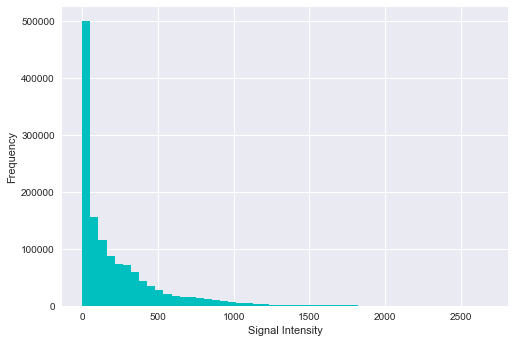

In [32]:
file_used=OUTPUT_PATH+"fullimages_%s.npy" % PATIENT_ID
imgs_to_process = np.load(file_used).astype(np.float64) 

plt.hist(imgs_to_process.flatten(), bins=50, color='c')
plt.xlabel("Signal Intensity")
plt.ylabel("Frequency")
plt.show()

Displaying an image stack

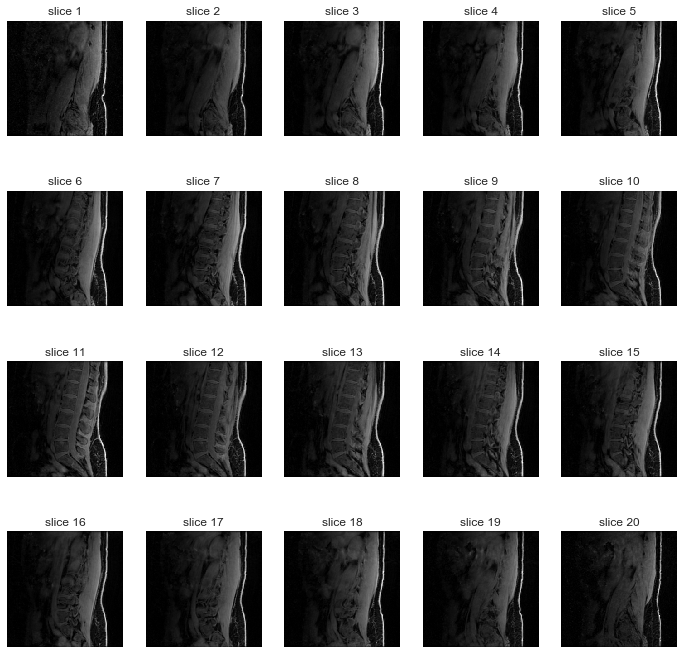

In [33]:
imgs_to_process = np.load(OUTPUT_PATH +'fullimages_{}.npy'.format(PATIENT_ID))

sample_stack(imgs_to_process)

## 3D Plotting

The marching cubes algorithm is used to generate a 3D mesh from the dataset. The `plotly` model will utilize a higher `step_size` with lower voxel threshold to avoid overwhelming the web browser.

In [34]:
def make_mesh(image, threshold=-300, step_size=1):

    print ("Transposing surface")
    p = image.transpose(2,1,0)
    
    print ("Calculating surface")
    verts, faces, norm, val = measure.marching_cubes_lewiner(p, threshold, step_size=step_size, allow_degenerate=True) 
    return verts, faces

def plotly_3d(verts, faces):
    x,y,z = zip(*verts) 
    
    print ("Drawing")
    
    # Make the colormap single color since the axes are positional not intensity. 
#    colormap=['rgb(255,105,180)','rgb(255,255,51)','rgb(0,191,255)']
    colormap=['rgb(236, 236, 212)','rgb(236, 236, 212)']
    
    fig = FF.create_trisurf(x=x,
                        y=y, 
                        z=z, 
                        plot_edges=False,
                        colormap=colormap,
                        simplices=faces,
                        backgroundcolor='rgb(64, 64, 64)',
                        title="Interactive Visualization")
    iplot(fig)

def plt_3d(verts, faces):
    print ("Drawing")
    x,y,z = zip(*verts) 
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], linewidths=0.05, alpha=1)
    face_color = [1, 1, 0.9]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, max(x))
    ax.set_ylim(0, max(y))
    ax.set_zlim(0, max(z))
    #ax.set_axis_bgcolor((0.7, 0.7, 0.7))
    plt.show()

Transposing surface
Calculating surface
Drawing


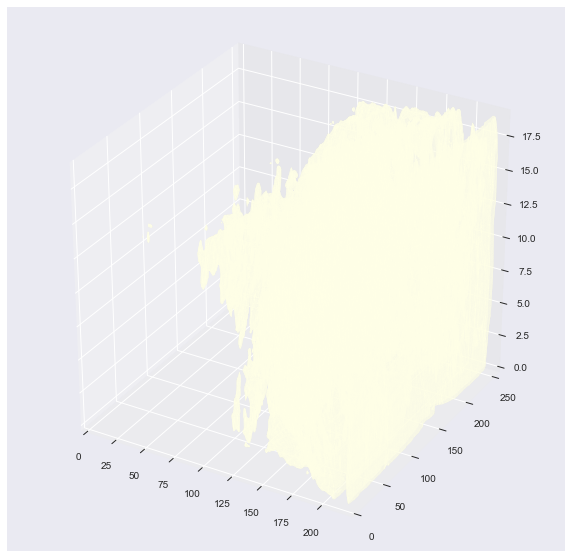

In [35]:
v, f = make_mesh(imgs_to_process, 350)
plt_3d(v, f)

In [36]:
v, f = make_mesh(imgs_to_process, 350, 2)
plotly_3d(v, f)

Transposing surface
Calculating surface
Drawing


Doesn't look nearly as nice as the CT images in the example...

## Segmentation

Load masks

In [8]:
MASK_PATH = "../data/Vertebrae/"+PATIENT_ID+"/mask*/"
g = glob(MASK_PATH + '/*.DCM')
g = natural_sort(g)

# Print out all file names
print ("All filenames:")
print ('\n'.join(g))

All filenames:
../data/Vertebrae/E4634/masks/E4634S1001I_mask_1.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_2.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_3.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_4.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_5.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_6.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_7.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_8.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_9.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_10.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_11.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_12.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_13.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_14.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_15.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_16.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_17.DCM
../data/Vertebrae/E4634/masks/E4634S1001I_mask_18.DCM
../data/Vertebrae/E463

In [40]:
patient_mask = load_scan(MASK_PATH)
masks = get_pixels(patient_mask)
np.save(OUTPUT_PATH + "fullimages_%s_mask.npy" % (PATIENT_ID), masks)

In [41]:
mask_used=OUTPUT_PATH+"fullimages_%s_mask.npy" % PATIENT_ID
masks_to_process = np.load(mask_used).astype(np.float64) 

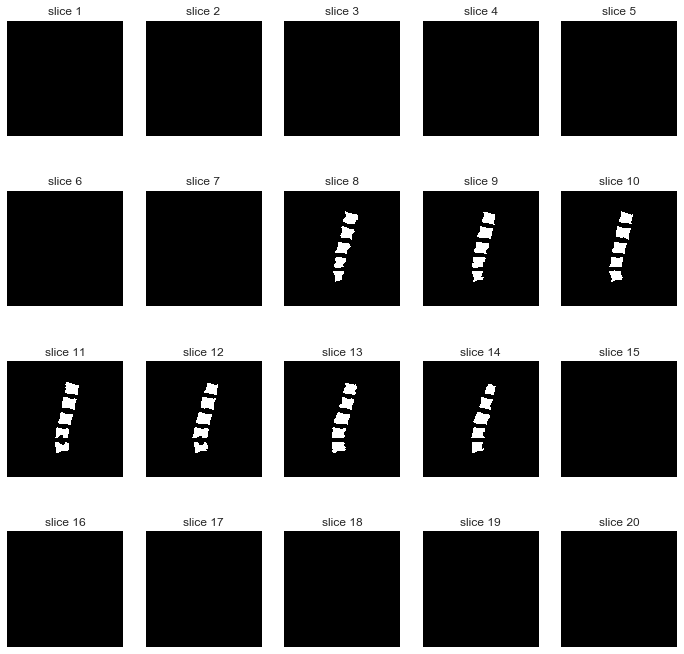

In [42]:
sample_stack(masks_to_process)

Apply masks

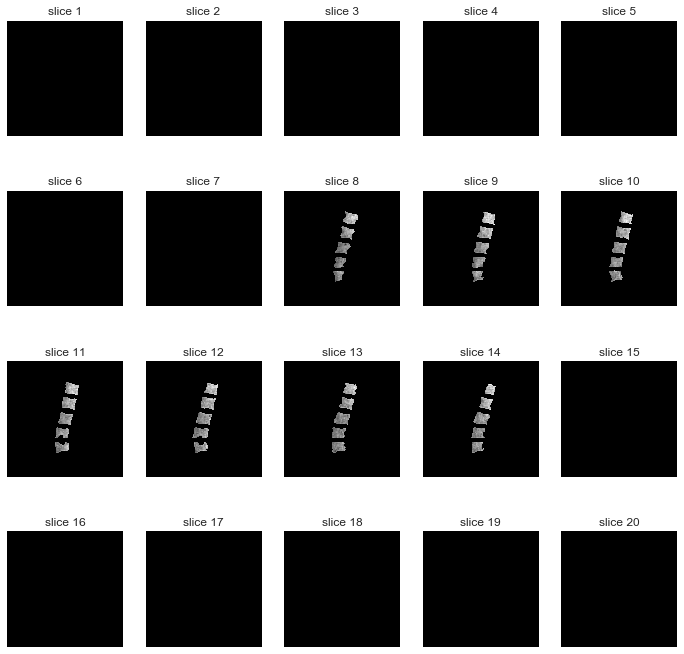

In [45]:
masked_imgs = np.multiply(masks_to_process, imgs_to_process)
sample_stack(masked_imgs)